## 1.Introduction

### What is Customer Churn?

Customer churn is defined as when customers or subscribers discontinue doing business with a firm or service.

Individualized customer retention is tough because most firms have a large number of customers and can't afford to devote much time to each of them. The costs would be too great, outweighing the additional revenue. However, if a corporation could forecast which customers are likely to leave ahead of time, it could focus customer retention efforts only on these "high risk" clients. The ultimate goal is to expand its coverage area and retrieve more customers loyalty. The core to succeed in this market lies in the customer itself.

Customer churn is a critical metric because it is much less expensive to retain existing customers than it is to acquire new customers.

### To reduce customer churn,companies need to predict which customers are at high risk of churn.

To detect early signs of potential churn, one must first develop a holistic view of the customers and their interactions across numerous channels, including store/branch visits, product purchase histories, customer service calls, Web-based transactions, and social media interactions, to mention a few.

As a result, by addressing churn, these businesses may not only preserve their market position, but also grow and thrive. More customers they have in their network, the lower the cost of initiation and the larger the profit. As a result, the company's key focus for success is reducing client attrition and implementing effective retention strategy.

### Objectives 

I will explore the data and try to answer some questions like:

What's the % of Churn Customers and customers that keep in with the active services?
Is there any patterns in Churn Customers based on the gender?
Is there any patterns/preference in Churn Customers based on the type of service provided?
What's the most profitable service types?
Which features and services are most profitable?
Many more questions that will arise during the analysis

## 2. Loading libraries and data 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#import pandas_profiling 
import plotly.offline as po
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
#Loading the dataset.

df = pd.read_excel("customer_churn_large_dataset.xlsx")

## 3. Undertanding the data 

In [3]:
df.shape

(100000, 9)

Each row represents a customer, each column contains customer’s attributes described on the column Metadata.

In [4]:
df.head()

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,1,Customer_1,63,Male,Los Angeles,17,73.36,236,0
1,2,Customer_2,62,Female,New York,1,48.76,172,0
2,3,Customer_3,24,Female,Los Angeles,5,85.47,460,0
3,4,Customer_4,36,Female,Miami,3,97.94,297,1
4,5,Customer_5,46,Female,Miami,19,58.14,266,0


The data set includes information about:

Customers who left within the last month – the column is called Churn

Customer account information - how long they’ve been a customer i.e. Subscription_Length_Months, contract, Monthly_Bill.

Demographic info about customers – gender, age, and where they live.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CustomerID                  100000 non-null  int64  
 1   Name                        100000 non-null  object 
 2   Age                         100000 non-null  int64  
 3   Gender                      100000 non-null  object 
 4   Location                    100000 non-null  object 
 5   Subscription_Length_Months  100000 non-null  int64  
 6   Monthly_Bill                100000 non-null  float64
 7   Total_Usage_GB              100000 non-null  int64  
 8   Churn                       100000 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 6.9+ MB


In [6]:
df.isnull().sum()

CustomerID                    0
Name                          0
Age                           0
Gender                        0
Location                      0
Subscription_Length_Months    0
Monthly_Bill                  0
Total_Usage_GB                0
Churn                         0
dtype: int64

In [7]:
df.nunique()

CustomerID                    100000
Name                          100000
Age                               53
Gender                             2
Location                           5
Subscription_Length_Months        24
Monthly_Bill                    7001
Total_Usage_GB                   451
Churn                              2
dtype: int64

In [8]:
df.describe()

,CustomerID,Age,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,44.027020,12.490100,65.053197,274.393650,0.497790
std,28867.657797,15.280283,6.926461,20.230696,130.463063,0.499998
min,1.000000,18.000000,1.000000,30.000000,50.000000,0.000000
25%,25000.750000,31.000000,6.000000,47.540000,161.000000,0.000000
50%,50000.500000,44.000000,12.000000,65.010000,274.000000,0.000000
75%,75000.250000,57.000000,19.000000,82.640000,387.000000,1.000000
max,100000.000000,70.000000,24.000000,100.000000,500.000000,1.000000


## 4. Visualize missing values  

In [9]:
df.duplicated().sum()

0

In [10]:
df['CustomerID'].value_counts()

CustomerID
1         1
66651     1
66673     1
66672     1
66671     1
         ..
33332     1
33331     1
33330     1
33329     1
100000    1
Name: count, Length: 100000, dtype: int64

In [11]:
df['Name'].value_counts()

Name
Customer_1         1
Customer_66651     1
Customer_66673     1
Customer_66672     1
Customer_66671     1
                  ..
Customer_33332     1
Customer_33331     1
Customer_33330     1
Customer_33329     1
Customer_100000    1
Name: count, Length: 100000, dtype: int64

In [12]:
df['Age'].value_counts()

Age
33    2046
50    1996
38    1970
63    1942
57    1942
19    1941
41    1939
42    1930
51    1929
59    1928
27    1924
66    1922
70    1921
44    1916
69    1912
61    1909
60    1904
31    1901
55    1900
21    1897
54    1896
53    1895
48    1895
39    1891
23    1887
20    1886
29    1885
28    1881
24    1876
58    1876
40    1875
30    1875
26    1874
56    1872
25    1871
37    1870
62    1867
46    1865
68    1863
43    1863
36    1859
49    1854
64    1848
47    1847
35    1845
18    1839
65    1833
45    1827
52    1824
32    1810
67    1798
34    1797
22    1787
Name: count, dtype: int64

In [13]:
df['Gender'].value_counts()

Gender
Female    50216
Male      49784
Name: count, dtype: int64

In [14]:
df['Location'].value_counts()

Location
Houston        20157
Los Angeles    20041
Miami          20031
Chicago        19958
New York       19813
Name: count, dtype: int64

In [15]:
df['Subscription_Length_Months'].value_counts()

Subscription_Length_Months
20    4303
22    4267
1     4247
16    4229
2     4228
14    4213
7     4211
11    4200
6     4184
5     4171
18    4171
12    4155
21    4154
13    4154
10    4151
3     4136
9     4134
15    4122
24    4113
8     4106
19    4106
4     4098
23    4083
17    4064
Name: count, dtype: int64

In [16]:
df['Monthly_Bill'].value_counts()

Monthly_Bill
84.37     34
61.99     29
38.26     28
66.38     28
56.17     28
          ..
77.04      4
91.04      3
64.01      3
36.55      3
100.00     3
Name: count, Length: 7001, dtype: int64

In [17]:
df['Total_Usage_GB'].value_counts()

Total_Usage_GB
72     270
232    261
86     260
218    259
153    256
      ... 
174    187
328    187
418    186
180    173
390    172
Name: count, Length: 451, dtype: int64

In [18]:
df['Churn'].value_counts()

Churn
0    50221
1    49779
Name: count, dtype: int64

## 5. Data Manipulation 

In [19]:
df = df.drop(['CustomerID'], axis = 1)
df = df.drop(['Name'], axis = 1)
df.head()

,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,63,Male,Los Angeles,17,73.36,236,0
1,62,Female,New York,1,48.76,172,0
2,24,Female,Los Angeles,5,85.47,460,0
3,36,Female,Miami,3,97.94,297,1
4,46,Female,Miami,19,58.14,266,0


The target that we will use to guide the exploration is Churn.

## 6. Data Visualization 

In [20]:
g_labels = ['Male', 'Female']
c_labels = ['No', 'Yes']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=g_labels, values=df['Gender'].value_counts(), name="Gender"),
              1, 1)
fig.add_trace(go.Pie(labels=c_labels, values=df['Churn'].value_counts(), name="Churn"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Gender and Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Gender', x=0.16, y=0.5, font_size=20, showarrow=False),
                 dict(text='Churn', x=0.84, y=0.5, font_size=20, showarrow=False)])
fig.show()


In [21]:
print(df["Churn"][df["Churn"]==0].groupby(by=df["Gender"]).count())
print(df["Churn"][df["Churn"]==1].groupby(by=df["Gender"]).count())

Gender
Female    25272
Male      24949
Name: Churn, dtype: int64
Gender
Female    24944
Male      24835
Name: Churn, dtype: int64


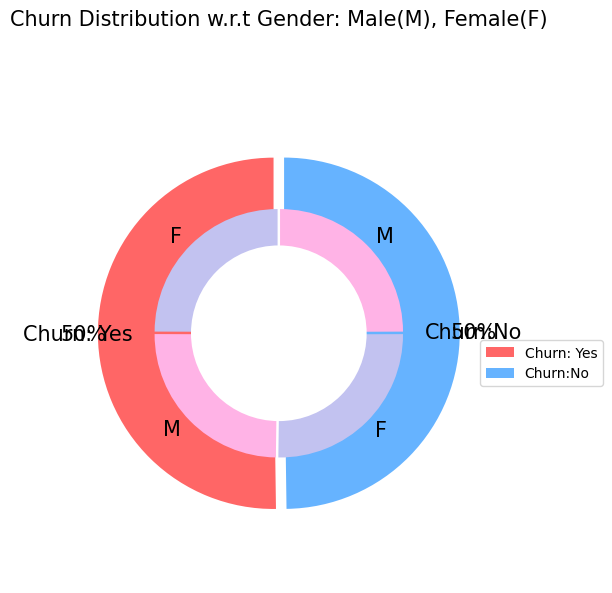

In [22]:
plt.figure(figsize=(6, 6))
labels =["Churn: Yes","Churn:No"]
values = [50221, 49779]
labels_gender = ["F","M","F","M"]
sizes_gender = [24944, 24835, 25272, 24949]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3) 
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}

# Plot
plt.pie(values, labels=labels, autopct='%1.0f%%', pctdistance=1.08, labeldistance=0.8, colors=colors, startangle=90, frame=True, explode=explode, radius=10, textprops=textprops, counterclock=True)
plt.pie(sizes_gender, labels=labels_gender, colors=colors_gender, startangle=90, explode=explode_gender, radius=7, textprops=textprops, counterclock=True)

# Draw circle
centre_circle = plt.Circle((0, 0), 5, color='black', fc='white', linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Title and Legend
plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)
plt.legend(labels, loc="best", bbox_to_anchor=(1, 0.5))

# Show plot
plt.axis('equal')
plt.tight_layout()
plt.show()

There is negligible difference in customer percentage/ count who chnaged the service provider. Both genders behaved in similar fashion when it comes to migrating to another service provider/firm.

In [23]:
l_labels = ['Houston', 'Los Angeles', 'Miami', 'Chicago', 'New York']
c_labels = ['No', 'Yes']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=l_labels, values=df['Location'].value_counts(), name="Location"),
              1, 1)
fig.add_trace(go.Pie(labels=c_labels, values=df['Churn'].value_counts(), name="Churn"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Location and Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Location', x=0.16, y=0.5, font_size=20, showarrow=False),
                 dict(text='Churn', x=0.84, y=0.5, font_size=20, showarrow=False)])
fig.show()


In [24]:
fig = px.histogram(df, x="Churn", color="Subscription_Length_Months", barmode="group", title="<b>Customer Subscription distribution<b>")
fig.update_layout(width=1000, height=500, bargap=0.1)
fig.show()

In [25]:
fig = px.histogram(df, x="Churn", color="Monthly_Bill", barmode="group", title="<b>Customer Subscription distribution<b>")
fig.update_layout(width=1000, height=500, bargap=0.1)
fig.show()

In [26]:
fig = px.histogram(df, x="Churn", color="Total_Usage_GB", barmode="group", title="<b>Customer Subscription distribution<b>")
fig.update_layout(width=1000, height=500, bargap=0.1)
fig.show()

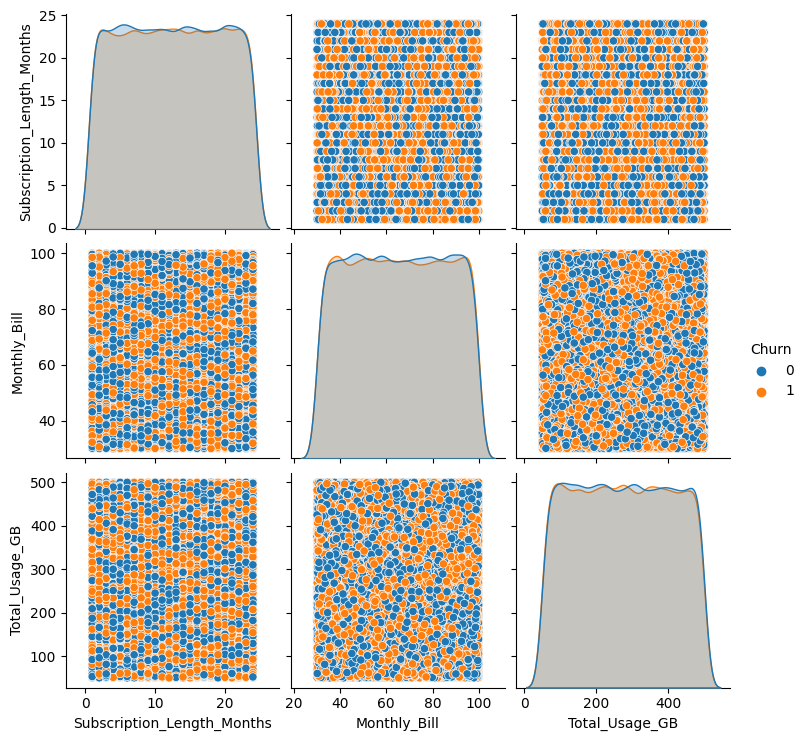

In [27]:
# Building pair plot
sns.pairplot(df,vars=['Subscription_Length_Months','Monthly_Bill', 'Total_Usage_GB'],hue='Churn')

In [28]:
 df[df["Gender"]=="Male"][["Subscription_Length_Months", "Churn"]].value_counts()

Subscription_Length_Months  Churn
1                           1        1109
2                           1        1089
14                          0        1088
21                          0        1088
20                          0        1087
22                          0        1083
15                          0        1079
22                          1        1067
10                          1        1067
2                           0        1059
20                          1        1058
13                          1        1058
5                           0        1056
14                          1        1056
11                          1        1056
                            0        1050
16                          1        1049
18                          1        1046
7                           1        1044
9                           0        1042
10                          0        1040
12                          1        1040
16                          0        1038


In [29]:
 df[df["Gender"]=="Male"][["Total_Usage_GB", "Churn"]].value_counts()

Total_Usage_GB  Churn
263             1        76
395             1        76
194             1        76
305             1        75
388             0        75
                         ..
490             1        38
250             1        38
362             1        38
444             0        36
195             0        36
Name: count, Length: 902, dtype: int64

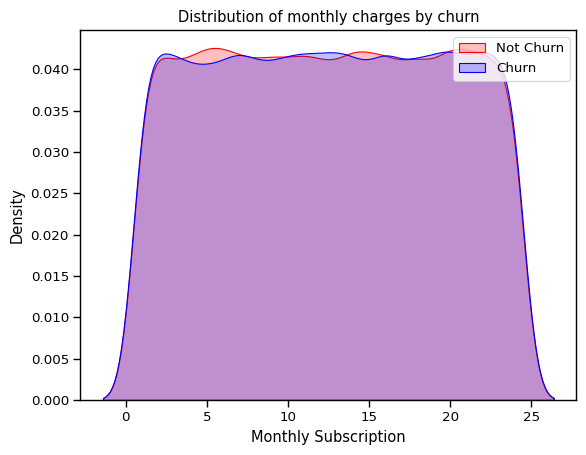

In [30]:
sns.set_context("paper",font_scale=1.1)
ax = sns.kdeplot(df.Subscription_Length_Months[(df["Churn"] == 0) ],
                color="Red", shade = True);
ax = sns.kdeplot(df.Subscription_Length_Months[(df["Churn"] == 1) ],
                ax =ax, color="Blue", shade= True);
ax.legend(["Not Churn","Churn"],loc='upper right');
ax.set_ylabel('Density');
ax.set_xlabel('Monthly Subscription');
ax.set_title('Distribution of monthly charges by churn');

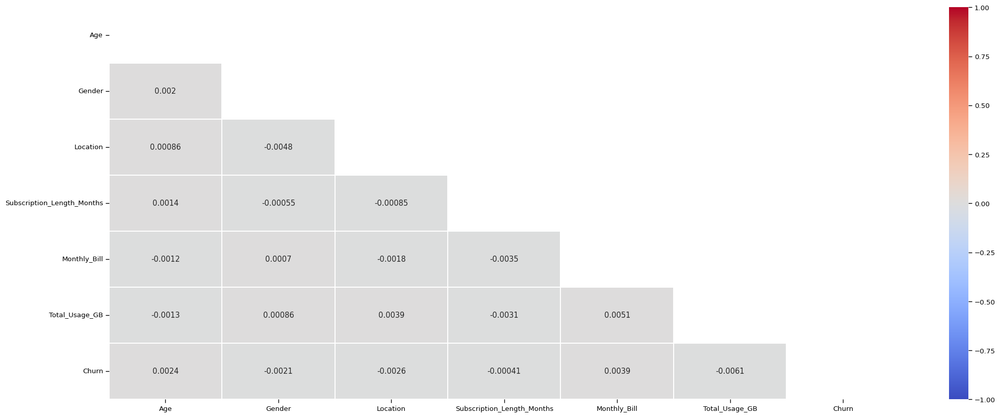

In [31]:
plt.figure(figsize=(25, 10))

corr = df.apply(lambda x: pd.factorize(x)[0]).corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)

## 7. Data Preprocessing

Loading Model-Specific Libraries

In [32]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

In [33]:
def object_to_int(dataframe_series):
    if dataframe_series.dtype=='object':
        dataframe_series = LabelEncoder().fit_transform(dataframe_series)
    return dataframe_series

In [34]:
df = df.apply(lambda x: object_to_int(x))
df.head()

,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,63,1,2,17,73.36,236,0
1,62,0,4,1,48.76,172,0
2,24,0,2,5,85.47,460,0
3,36,0,3,3,97.94,297,1
4,46,0,3,19,58.14,266,0


In [35]:
plt.figure(figsize=(14,7))
df.corr()['Churn'].sort_values(ascending = False)

Churn                         1.000000
Location                      0.006405
Subscription_Length_Months    0.002328
Gender                        0.002121
Age                           0.001559
Monthly_Bill                 -0.000211
Total_Usage_GB               -0.002842
Name: Churn, dtype: float64

<Figure size 1400x700 with 0 Axes>

In [36]:
X = df.drop(columns = ['Churn'])
y = df['Churn'].values

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.30, random_state = 40, stratify=y)

In [38]:
def distplot(feature, frame, color='r'):
    plt.figure(figsize=(8,3))
    plt.title("Distribution for {}".format(feature))
    ax = sns.distplot(frame[feature], color= color)

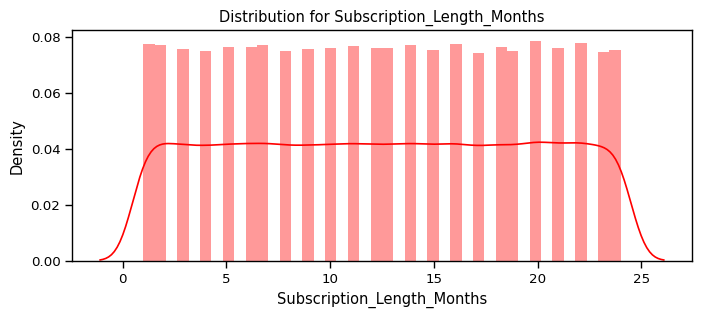

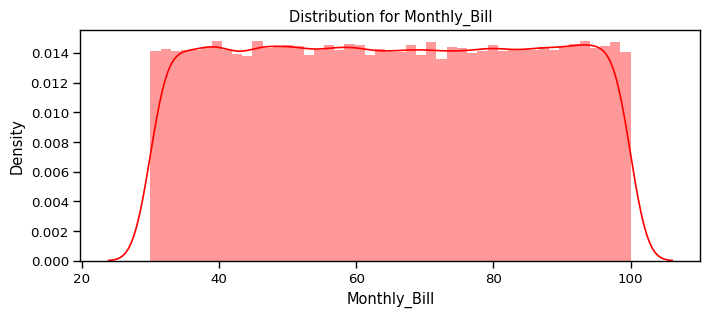

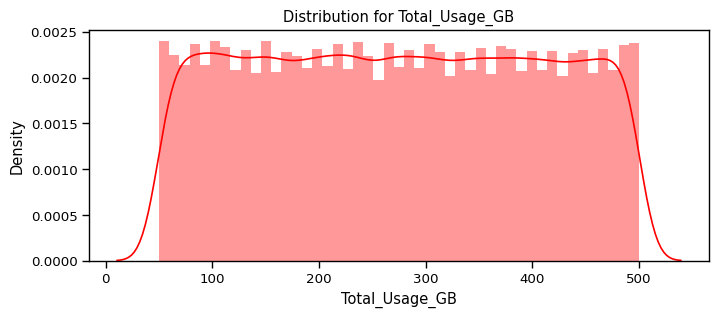

In [39]:
num_cols = ['Subscription_Length_Months','Monthly_Bill', 'Total_Usage_GB']
for feat in num_cols: distplot(feat, df)

Since the numerical features are distributed over different value ranges, I will use standard scalar to scale them down to the same range.

#### Standardizing numeric attributes

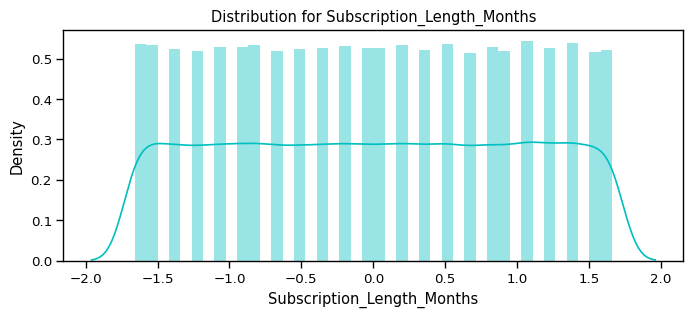

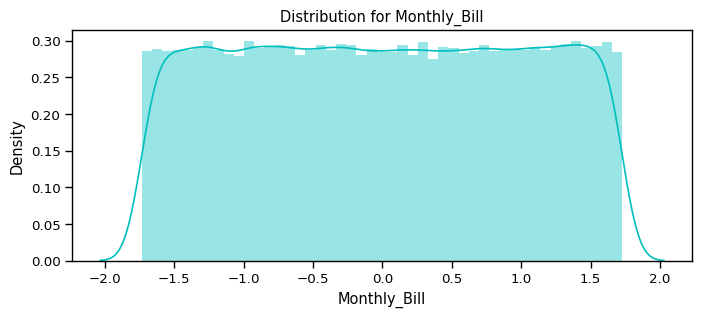

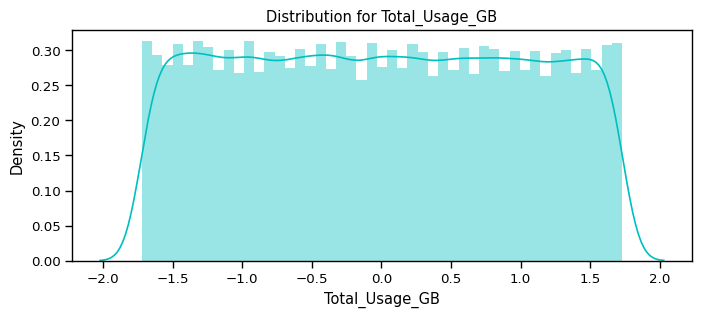

In [40]:
df_std = pd.DataFrame(StandardScaler().fit_transform(df[num_cols].astype('float64')),
                       columns=num_cols)
for feat in num_cols: distplot(feat, df_std, color='c')

In [41]:
# Divide the columns into 3 categories, one for standardisation, one for label encoding and one for one hot encoding

cat_cols_ohe =['Subscription_Length_Months','Monthly_Bill', 'Total_Usage_GB'] # those that need one-hot encoding
cat_cols_le = list(set(X_train.columns)- set(num_cols) - set(cat_cols_ohe)) #those that need label encoding

In [42]:
scaler= StandardScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

## 8.Machine Learning Model Evaluations and Predictions.



### KNN

In [43]:
knn_model = KNeighborsClassifier(n_neighbors = 11) 
knn_model.fit(X_train,y_train)
predicted_y = knn_model.predict(X_test)
accuracy_knn = knn_model.score(X_test,y_test)
print("KNN accuracy:",accuracy_knn)

KNN accuracy: 0.49853333333333333


In [44]:
print(classification_report(y_test, predicted_y))

              precision    recall  f1-score   support

           0       0.50      0.51      0.51     15066
           1       0.50      0.49      0.49     14934

    accuracy                           0.50     30000
   macro avg       0.50      0.50      0.50     30000
weighted avg       0.50      0.50      0.50     30000



### SVC

Train accuracy SVM:  0.5015714285714286
Test accuracy SVM:  0.4953
Recall Score:  0.820342841837418
----------------------------------------------------------------------------------------------------


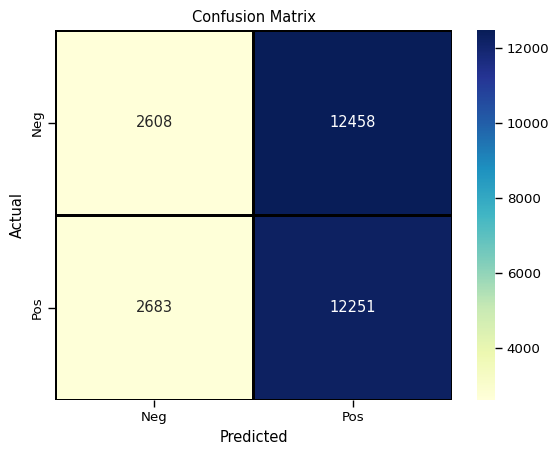

In [45]:
# Training the model again using the optimal parameters discovered
best_parameter = 3
svm_clf =  SVC(C=best_parameter,class_weight='balanced', random_state=43)
svm_clf.fit(X_train,y_train)

result2 = ["2.","SVM","Balanced using class weights"]
y_pred_tr = svm_clf.predict(X_train)
print('Train accuracy SVM: ',accuracy_score(y_train,y_pred_tr))
result2.append(round(accuracy_score(y_train,y_pred_tr),2))

y_pred_test = svm_clf.predict(X_test)
print('Test accuracy SVM: ',accuracy_score(y_test,y_pred_test))
result2.append(round(accuracy_score(y_test,y_pred_test),2))

recall = recall_score(y_test,y_pred_test)
print("Recall Score: ",recall)
result2.append(round(recall,2))
print("-----"*20)

cm = confusion_matrix(y_test,y_pred_test)
ax=plt.subplot();
sns.heatmap(cm, annot=True, fmt='d', linewidths=2, linecolor='black', cmap='YlGnBu',ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_ylim(2.0,0)
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Neg','Pos'])
ax.yaxis.set_ticklabels(['Neg','Pos'])
plt.show()

In [48]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.49      0.17      0.26     15066
           1       0.50      0.82      0.62     14934

    accuracy                           0.50     30000
   macro avg       0.49      0.50      0.44     30000
weighted avg       0.49      0.50      0.44     30000



### Random Forest



In [49]:
model_rf = RandomForestClassifier(n_estimators=500 , oob_score = True, n_jobs = -1,
                                  random_state =50, max_features = "auto",
                                  max_leaf_nodes = 30)
model_rf.fit(X_train, y_train)

# Make predictions
prediction_test = model_rf.predict(X_test)
print (metrics.accuracy_score(y_test, prediction_test))

0.4996333333333333


In [50]:
print(classification_report(y_test, prediction_test))

              precision    recall  f1-score   support

           0       0.50      0.64      0.56     15066
           1       0.50      0.36      0.42     14934

    accuracy                           0.50     30000
   macro avg       0.50      0.50      0.49     30000
weighted avg       0.50      0.50      0.49     30000



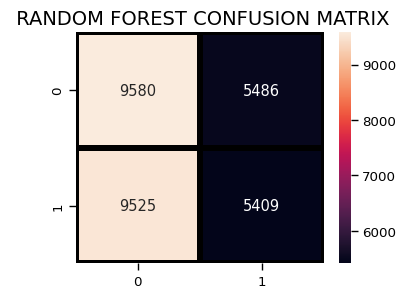

In [51]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, prediction_test),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title(" RANDOM FOREST CONFUSION MATRIX",fontsize=14)
plt.show()

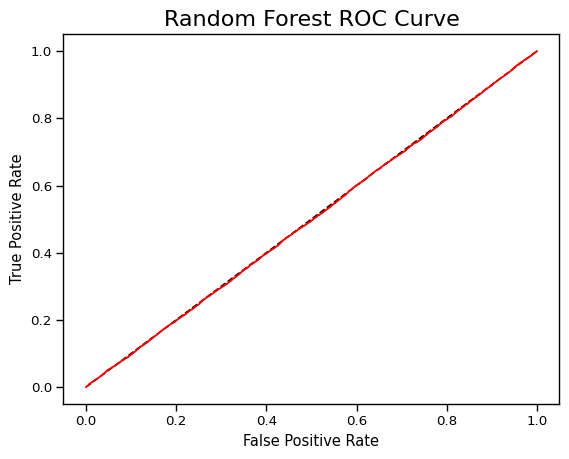

In [52]:
y_rfpred_prob = model_rf.predict_proba(X_test)[:,1]
fpr_rf, tpr_rf, thresholds = roc_curve(y_test, y_rfpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_rf, tpr_rf, label='Random Forest',color = "r")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC Curve',fontsize=16)
plt.show();

### Logistic Regression



In [53]:
lr_model = LogisticRegression()
lr_model.fit(X_train,y_train)
accuracy_lr = lr_model.score(X_test,y_test)
print("Logistic Regression accuracy is :",accuracy_lr)

Logistic Regression accuracy is : 0.5022333333333333


In [54]:
lr_pred= lr_model.predict(X_test)
report = classification_report(y_test,lr_pred)
print(report)

              precision    recall  f1-score   support

           0       0.50      0.70      0.59     15066
           1       0.50      0.30      0.37     14934

    accuracy                           0.50     30000
   macro avg       0.50      0.50      0.48     30000
weighted avg       0.50      0.50      0.48     30000



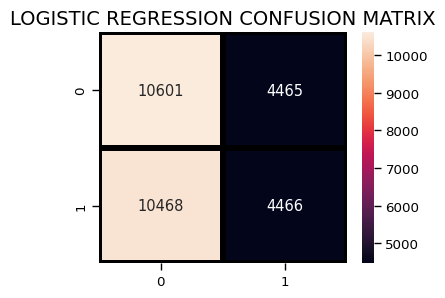

In [55]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, lr_pred),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("LOGISTIC REGRESSION CONFUSION MATRIX",fontsize=14)
plt.show()

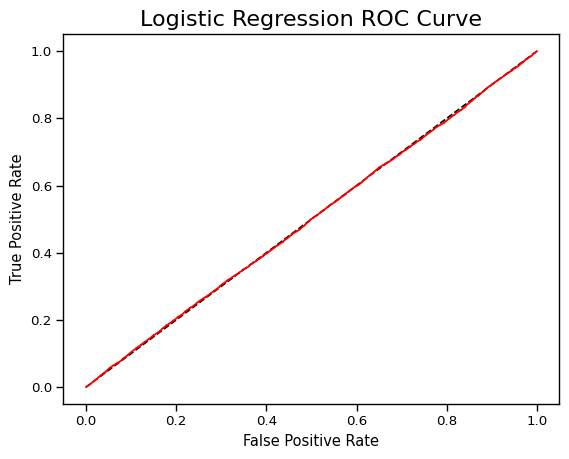

In [56]:
y_pred_prob = lr_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr, tpr, label='Logistic Regression',color = "r")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve',fontsize=16)
plt.show();

### Decision Tree Classifier



In [57]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.5029666666666667


In [58]:
print(classification_report(y_test, predictdt_y))

              precision    recall  f1-score   support

           0       0.51      0.51      0.51     15066
           1       0.50      0.50      0.50     14934

    accuracy                           0.50     30000
   macro avg       0.50      0.50      0.50     30000
weighted avg       0.50      0.50      0.50     30000



### AdaBoost Classifier



In [59]:
a_model = AdaBoostClassifier()
a_model.fit(X_train,y_train)
a_preds = a_model.predict(X_test)
print("AdaBoost Classifier accuracy")
metrics.accuracy_score(y_test, a_preds)

AdaBoost Classifier accuracy


0.49366666666666664

In [60]:
print(classification_report(y_test, a_preds))

              precision    recall  f1-score   support

           0       0.50      0.58      0.53     15066
           1       0.49      0.41      0.45     14934

    accuracy                           0.49     30000
   macro avg       0.49      0.49      0.49     30000
weighted avg       0.49      0.49      0.49     30000



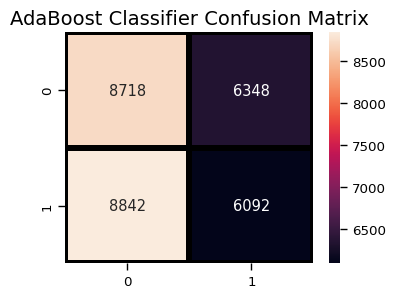

In [61]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, a_preds),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("AdaBoost Classifier Confusion Matrix",fontsize=14)
plt.show()

### Gradient Boosting Classifier



In [62]:
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
gb_pred = gb.predict(X_test)
print("Gradient Boosting Classifier", accuracy_score(y_test, gb_pred))

Gradient Boosting Classifier 0.49966666666666665


In [63]:
print(classification_report(y_test, gb_pred))

              precision    recall  f1-score   support

           0       0.50      0.56      0.53     15066
           1       0.50      0.44      0.47     14934

    accuracy                           0.50     30000
   macro avg       0.50      0.50      0.50     30000
weighted avg       0.50      0.50      0.50     30000



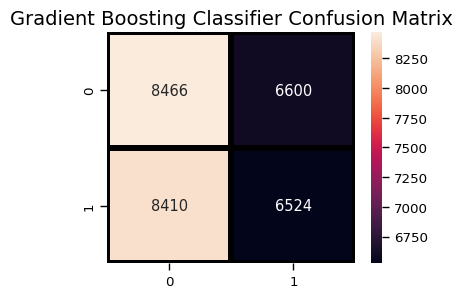

In [64]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, gb_pred),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("Gradient Boosting Classifier Confusion Matrix",fontsize=14)
plt.show()

### Voting Classifier 

Let's now predict the final model based on the highest majority of voting and check it's score.

In [65]:
from sklearn.ensemble import VotingClassifier
clf1 = GradientBoostingClassifier()
clf2 = LogisticRegression()
clf3 = AdaBoostClassifier()
eclf1 = VotingClassifier(estimators=[('gbc', clf1), ('lr', clf2), ('abc', clf3)], voting='soft')
eclf1.fit(X_train, y_train)
predictions = eclf1.predict(X_test)
print("Final Accuracy Score ")
print(accuracy_score(y_test, predictions))

Final Accuracy Score 
0.49816666666666665


In [66]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.50      0.60      0.55     15066
           1       0.49      0.39      0.44     14934

    accuracy                           0.50     30000
   macro avg       0.50      0.50      0.49     30000
weighted avg       0.50      0.50      0.49     30000



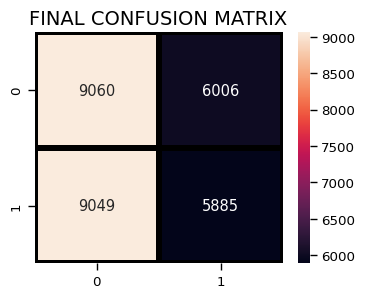

In [67]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, predictions),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("FINAL CONFUSION MATRIX",fontsize=14)
plt.show()

Customer churn is definitely bad to a firm ’s profitability. Various strategies can be implemented to eliminate customer churn. The best way to avoid customer churn is for a company to truly know its customers. This includes identifying customers who are at risk of churning and working to improve their satisfaction. Improving customer service is, of course, at the top of the priority for tackling this issue. Building customer loyalty through relevant experiences and specialized service is another strategy to reduce customer churn. Some firms survey customers who have already churned to understand their reasons for leaving in order to adopt a proactive approach to avoiding future customer churn.

